In [1]:
import tensorflow as tf

# List available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            # Set memory growth to True to allocate memory as needed
            tf.config.experimental.set_memory_growth(gpu, True)
            # Set a memory limit of 10GB (10240MB)
            tf.config.experimental.set_virtual_device_configuration(
                gpu,
                [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=11264)])
    except RuntimeError as e:
        print(e)


In [2]:
# Print TensorFlow version
print("TensorFlow version:", tf.__version__)

# List all physical devices
gpus = tf.config.list_physical_devices('GPU')
print("GPUs available:", gpus)

# Check if TensorFlow is using the GPU
if gpus:
    print("Number of GPUs available: ", len(gpus))
    for gpu in gpus:
        print("GPU:", gpu)

    # Perform a simple computation on the GPU
    with tf.device('/GPU:0'):
        a = tf.constant(2.0)
        b = tf.constant(3.0)
        c = a * b
        print(f"Result of computation on GPU: {c.numpy()}")
else:
    print("No GPU found")


TensorFlow version: 2.10.0
GPUs available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Number of GPUs available:  1
GPU: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
Result of computation on GPU: 6.0


# Get the data

In [3]:
train_dir = "D:\\Wikiart_splitted\\train"
test_dir = "D:\\Wikiart_splitted\\test"
val_dir= "D:\\Wikiart_splitted\\val"

In [4]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path to the dataset directory
dataset_path = train_dir

# Explore the dataset
categories = os.listdir(dataset_path)
total_images = 0
image_dimensions = {}

# Loop through each category
for category in categories:
    category_path = os.path.join(dataset_path, category)
    images = os.listdir(category_path)
    total_images += len(images)
    
    print(f'Category: {category}, Number of Images: {len(images)}')
    
    # Analyze image dimensions 
    for image_name in images[:10]:  # Only sample 10 images per category
        image_path = os.path.join(category_path, image_name)
        with Image.open(image_path) as img:
            size = img.size
            if size in image_dimensions:
                image_dimensions[size] += 1
            else:
                image_dimensions[size] = 1

# Display total images
print(f'Total number of images in the dataset: {total_images}')




Category: Art_Novueau, Number of Images: 3479
Category: Baroque, Number of Images: 3392
Category: Color_field_painting, Number of Images: 1279
Category: Cubism, Number of Images: 2052
Category: Early_renaissance, Number of Images: 1106
Category: Expressionism, Number of Images: 5410
Category: Fauvism, Number of Images: 744
Category: High_renaissance, Number of Images: 1094
Category: Impressionism, Number of Images: 10424
Category: Mannerism_late_renaissance, Number of Images: 1018
Category: Minimalism, Number of Images: 1058
Category: Native_art_primitivism, Number of Images: 1898
Category: Northern_renaissance, Number of Images: 2051
Category: Pop_art, Number of Images: 1186
Category: Post_impression, Number of Images: 5184
Category: Realism, Number of Images: 9194
Category: Romanticism, Number of Images: 5617
Category: Symbolism, Number of Images: 3642
Category: Ukiyo_e, Number of Images: 940
Total number of images in the dataset: 60768


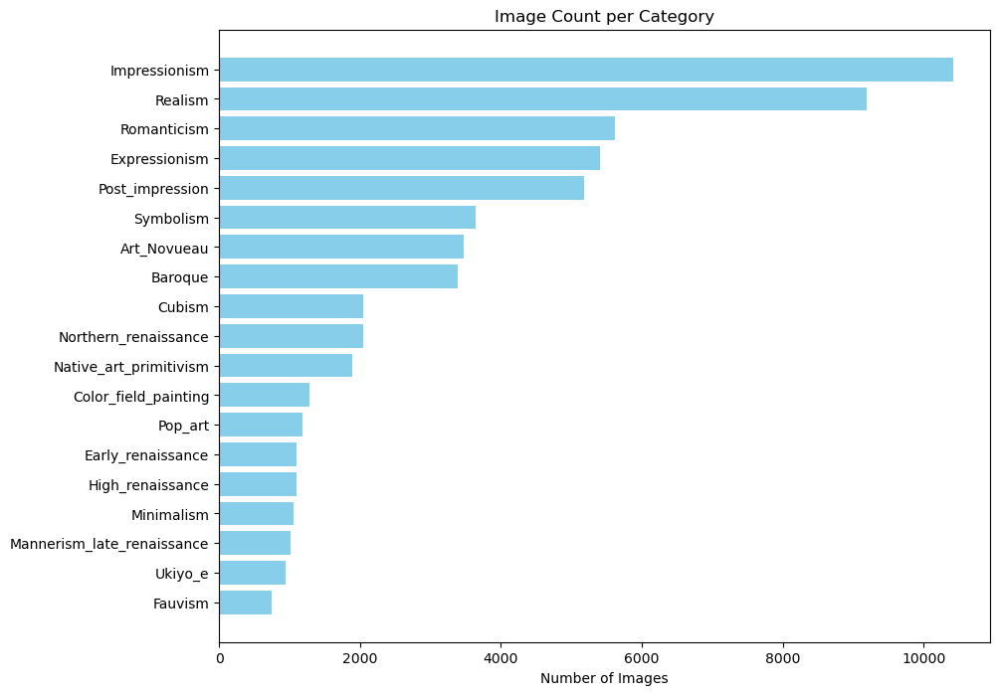

In [13]:
# Get a list of categories and count images in each
categories = os.listdir(dataset_path)
image_counts = []

for category in categories:
    category_path = os.path.join(dataset_path, category)
    image_count = len(os.listdir(category_path))
    image_counts.append(image_count)

# Sort categories by image count for better visualization (optional)
sorted_indices = sorted(range(len(image_counts)), key=lambda k: image_counts[k], reverse=True)
sorted_categories = [categories[i] for i in sorted_indices]
sorted_image_counts = [image_counts[i] for i in sorted_indices]

# Create a bar graph
plt.figure(figsize=(10, 8))
plt.barh(sorted_categories, sorted_image_counts, color='skyblue')
plt.xlabel('Number of Images')
plt.title('Image Count per Category')
plt.gca().invert_yaxis()  # Invert y-axis to have the category with most images on top
plt.show()

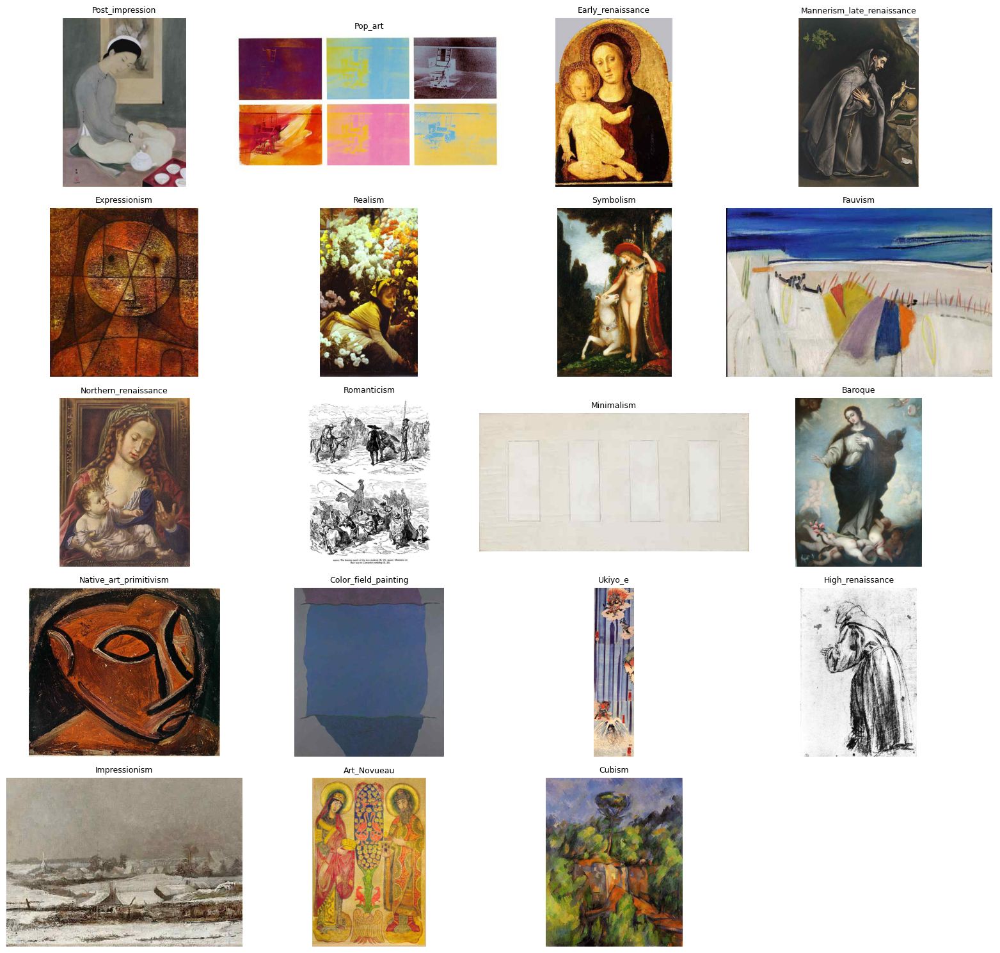

In [12]:
# Set a seed for reproducibility
random.seed(42)

# Explore the dataset
categories = os.listdir(dataset_path)

# grid dimensions
cols = 4
rows = 5
total_cells = cols * rows

# Initialize the figure
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(cols * 4, rows * 3))
axs = axs.flatten()  # Flatten the 2D array of axes

# Shuffle categories to randomly select if there are more than can be displayed
random.shuffle(categories)

# Display images
for i, ax in enumerate(axs):
    if i < len(categories):
        category = categories[i]
        category_path = os.path.join(dataset_path, category)
        images = os.listdir(category_path)
        random.shuffle(images)  # Shuffle images to select randomly
        displayed = False

        # Attempt to display the first valid image
        for image_name in images:
            try:
                image_path = os.path.join(category_path, image_name)
                img = Image.open(image_path)
                img.verify()  # Verify that this is a valid image
                img = Image.open(image_path)  # Reopen for displaying

                # Optional: Check if the image is (not a tiny or blank image)
                if img.width > 10 and img.height > 10:
                    ax.imshow(img)
                    ax.axis('off')
                    ax.set_title(category, fontsize=9)
                    displayed = True
                    break
            except (IOError, SyntaxError):
                continue  # Skip this image if it causes any error

        if not displayed:
            ax.axis('off')  # If no valid image is found, do not display anything in this cell
    else:
        ax.axis('off')  # Turn off any unused axes

plt.tight_layout()
plt.show()

# Evaluating model performance:

# Model 1: Resnet

Found 7596 images belonging to 19 classes.
238/238 [==============================] - 74s 309ms/step


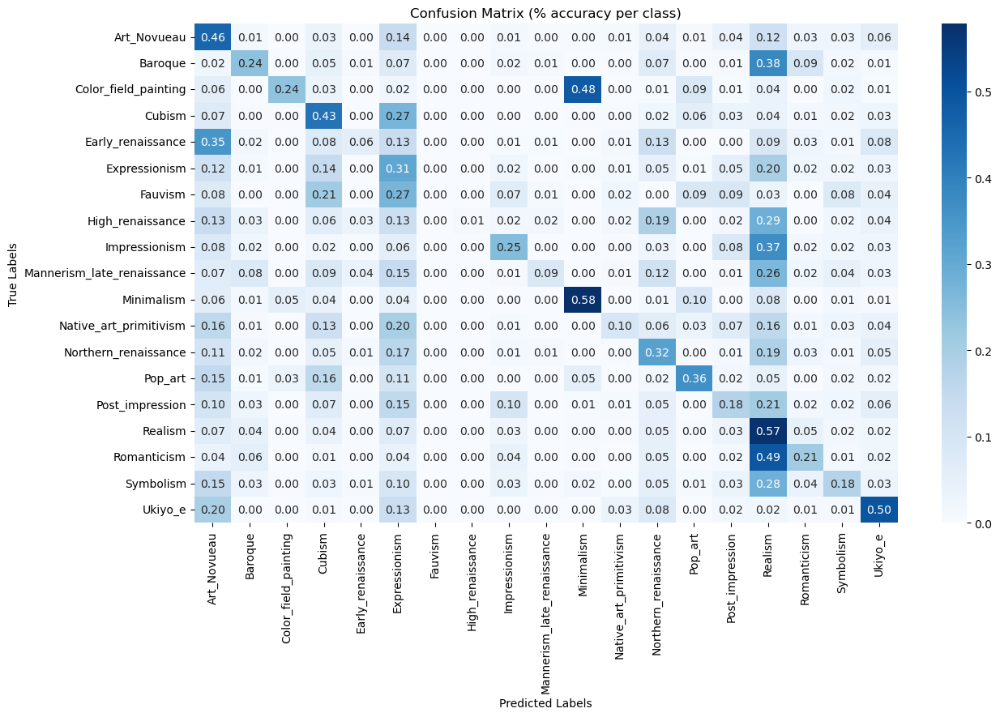

                            precision    recall  f1-score   support

               Art_Novueau       0.22      0.46      0.30       413
                   Baroque       0.35      0.24      0.28       418
      Color_field_painting       0.74      0.24      0.36       182
                    Cubism       0.22      0.43      0.29       261
         Early_renaissance       0.21      0.06      0.09       157
             Expressionism       0.22      0.31      0.26       659
                   Fauvism       0.00      0.00      0.00        89
          High_renaissance       1.00      0.01      0.02       126
             Impressionism       0.65      0.25      0.37      1314
Mannerism_late_renaissance       0.43      0.09      0.15       137
                Minimalism       0.41      0.58      0.48       147
    Native_art_primitivism       0.39      0.10      0.16       278
      Northern_renaissance       0.18      0.32      0.23       240
                   Pop_art       0.41      0.36

In [23]:
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Path to saved model
model_path = "C:\\Users\\PRANAV\\Downloads\\bagging_cnn1.h5"
model = load_model(model_path)


test_data_directory = "D:\\Wikiart_splitted\\test"

batch_size = 32
image_height = 224
image_width = 224

# ImageDataGenerator for preprocessing and loading test images
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_directory,
    target_size=(image_height, image_width), 
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=False)

# Make predictions
predictions = model.predict(test_generator, steps=np.ceil(test_generator.samples/test_generator.batch_size), verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

# True labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Get class labels from the generator

# Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Normalize the confusion matrix
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot confusion matrix
plt.figure(figsize=(14, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix (% accuracy per class)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Classification Report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

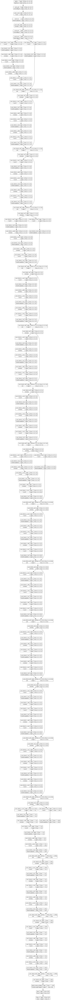

In [6]:
from tensorflow.keras.utils import plot_model

# Load the model
model_path = "C:\\Users\\PRANAV\\Downloads\\bagging_cnn1.h5"
model = load_model(model_path)

# Plot the model
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)


In [5]:
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns


# Model 2: Xception Model

Found 7596 images belonging to 19 classes.
238/238 [==============================] - 76s 317ms/step


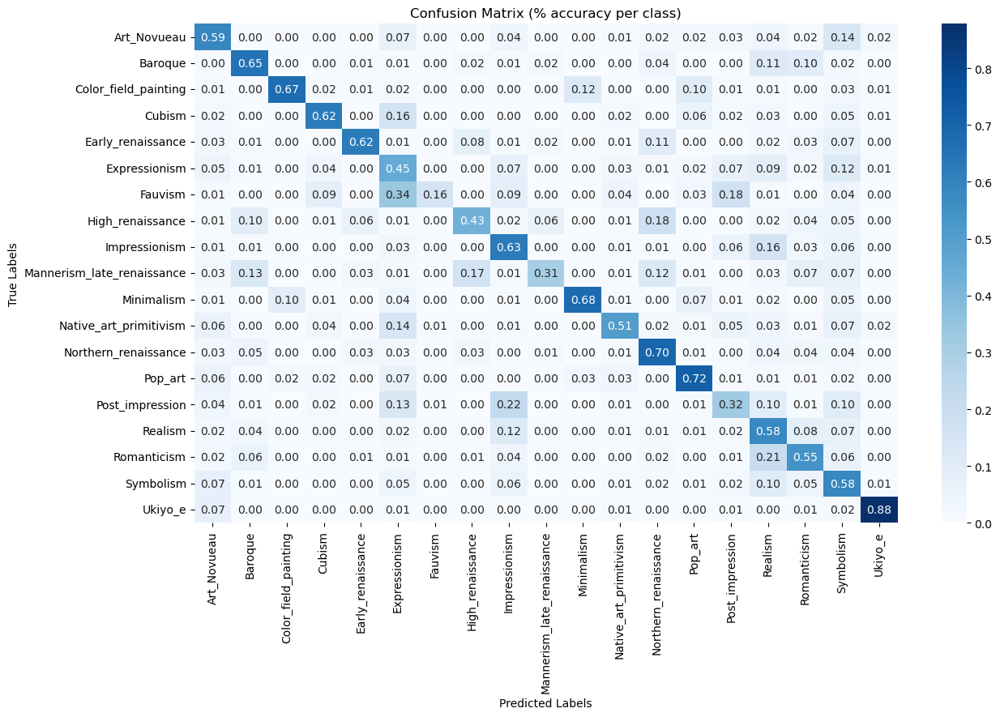

                            precision    recall  f1-score   support

               Art_Novueau       0.54      0.59      0.56       413
                   Baroque       0.65      0.65      0.65       418
      Color_field_painting       0.87      0.67      0.76       182
                    Cubism       0.67      0.62      0.65       261
         Early_renaissance       0.75      0.62      0.68       157
             Expressionism       0.46      0.45      0.46       659
                   Fauvism       0.56      0.16      0.25        89
          High_renaissance       0.44      0.43      0.44       126
             Impressionism       0.67      0.63      0.64      1314
Mannerism_late_renaissance       0.58      0.31      0.40       137
                Minimalism       0.76      0.68      0.72       147
    Native_art_primitivism       0.65      0.51      0.57       278
      Northern_renaissance       0.55      0.70      0.61       240
                   Pop_art       0.49      0.72

In [26]:
# Path to saved model
model_path = "C:\\Users\\PRANAV\\Downloads\\best_xcept_model.h5"
model = load_model(model_path)


test_data_directory = "D:\\Wikiart_splitted\\test"

batch_size = 32
image_height = 224
image_width = 224

# ImageDataGenerator for preprocessing and loading test images
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_directory,
    target_size=(image_height, image_width), 
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=False)

# Make predictions
predictions = model.predict(test_generator, steps=np.ceil(test_generator.samples/test_generator.batch_size), verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

# True labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Get class labels from the generator

# Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Normalize the confusion matrix
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot confusion matrix
plt.figure(figsize=(14, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix (% accuracy per class)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Classification Report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

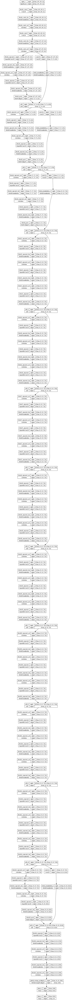

In [7]:
# Load the model
model_path = "C:\\Users\\PRANAV\\Downloads\\best_xcept_model.h5"
model = load_model(model_path)

# Plot the model
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)


# Model 3: DenseNet121

Found 7596 images belonging to 19 classes.
238/238 [==============================] - 76s 309ms/step


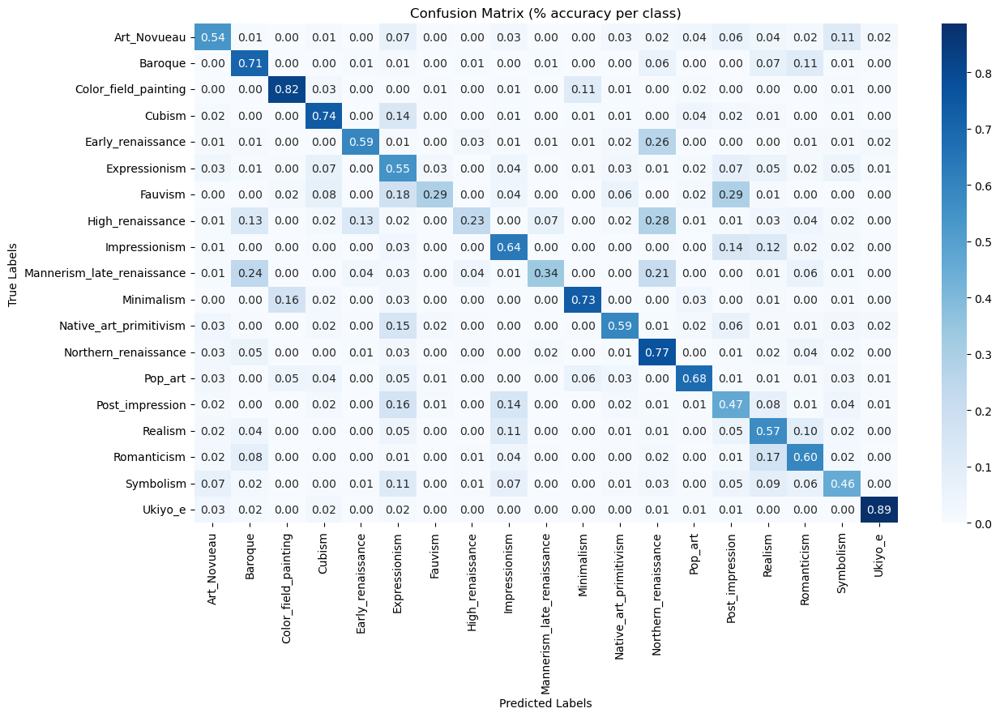

                            precision    recall  f1-score   support

               Art_Novueau       0.61      0.54      0.57       413
                   Baroque       0.61      0.71      0.65       418
      Color_field_painting       0.81      0.82      0.81       182
                    Cubism       0.65      0.74      0.69       261
         Early_renaissance       0.73      0.59      0.65       157
             Expressionism       0.47      0.55      0.50       659
                   Fauvism       0.40      0.29      0.34        89
          High_renaissance       0.54      0.23      0.32       126
             Impressionism       0.72      0.64      0.68      1314
Mannerism_late_renaissance       0.61      0.34      0.43       137
                Minimalism       0.73      0.73      0.73       147
    Native_art_primitivism       0.67      0.59      0.63       278
      Northern_renaissance       0.47      0.77      0.58       240
                   Pop_art       0.61      0.68

In [27]:
# Path to saved model
model_path = "C:\\Users\\PRANAV\\Downloads\\Densenet121_01.h5"
model = load_model(model_path)


test_data_directory = "D:\\Wikiart_splitted\\test"

batch_size = 32
image_height = 224
image_width = 224

# ImageDataGenerator for preprocessing and loading test images
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_directory,
    target_size=(image_height, image_width), 
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=False)

# Make predictions
predictions = model.predict(test_generator, steps=np.ceil(test_generator.samples/test_generator.batch_size), verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

# True labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Get class labels from the generator

# Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Normalize the confusion matrix
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot confusion matrix
plt.figure(figsize=(14, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix (% accuracy per class)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Classification Report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

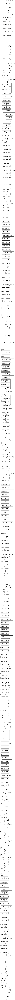

In [8]:
# Load the model
model_path = "C:\\Users\\PRANAV\\Downloads\\Densenet121_01.h5"
model = load_model(model_path)

# Plot the model
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)


# Model4: VGG19

Found 7596 images belonging to 19 classes.
238/238 [==============================] - 76s 309ms/step


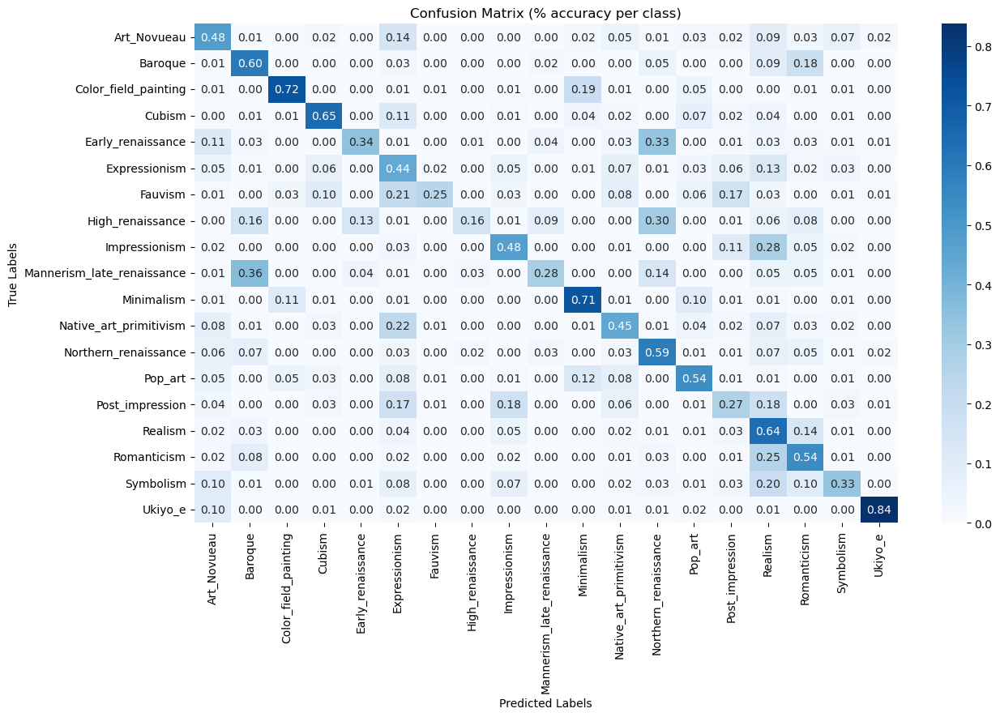

                            precision    recall  f1-score   support

               Art_Novueau       0.46      0.48      0.47       413
                   Baroque       0.55      0.60      0.57       418
      Color_field_painting       0.78      0.72      0.75       182
                    Cubism       0.64      0.65      0.64       261
         Early_renaissance       0.62      0.34      0.44       157
             Expressionism       0.38      0.44      0.41       659
                   Fauvism       0.49      0.25      0.33        89
          High_renaissance       0.62      0.16      0.25       126
             Impressionism       0.71      0.48      0.57      1314
Mannerism_late_renaissance       0.49      0.28      0.36       137
                Minimalism       0.54      0.71      0.61       147
    Native_art_primitivism       0.39      0.45      0.41       278
      Northern_renaissance       0.43      0.59      0.50       240
                   Pop_art       0.41      0.54

In [28]:
# Path to saved model
model_path = "C:\\Users\\PRANAV\\Downloads\\vgg19_1.h5"
model = load_model(model_path)


test_data_directory = "D:\\Wikiart_splitted\\test"

batch_size = 32
image_height = 224
image_width = 224

# ImageDataGenerator for preprocessing and loading test images
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_directory,
    target_size=(image_height, image_width), 
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=False)

# Make predictions
predictions = model.predict(test_generator, steps=np.ceil(test_generator.samples/test_generator.batch_size), verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

# True labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Get class labels from the generator

# Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Normalize the confusion matrix
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot confusion matrix
plt.figure(figsize=(14, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix (% accuracy per class)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Classification Report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

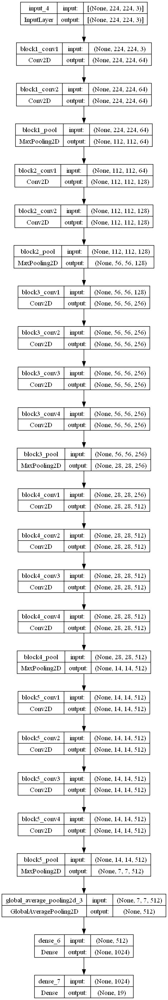

In [9]:
# Load the model
model_path = "C:\\Users\\PRANAV\\Downloads\\vgg19_1.h5"
model = load_model(model_path)

# Plot the model
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)


# Model 5: Mobvnet

Found 7596 images belonging to 19 classes.
238/238 [==============================] - 74s 307ms/step


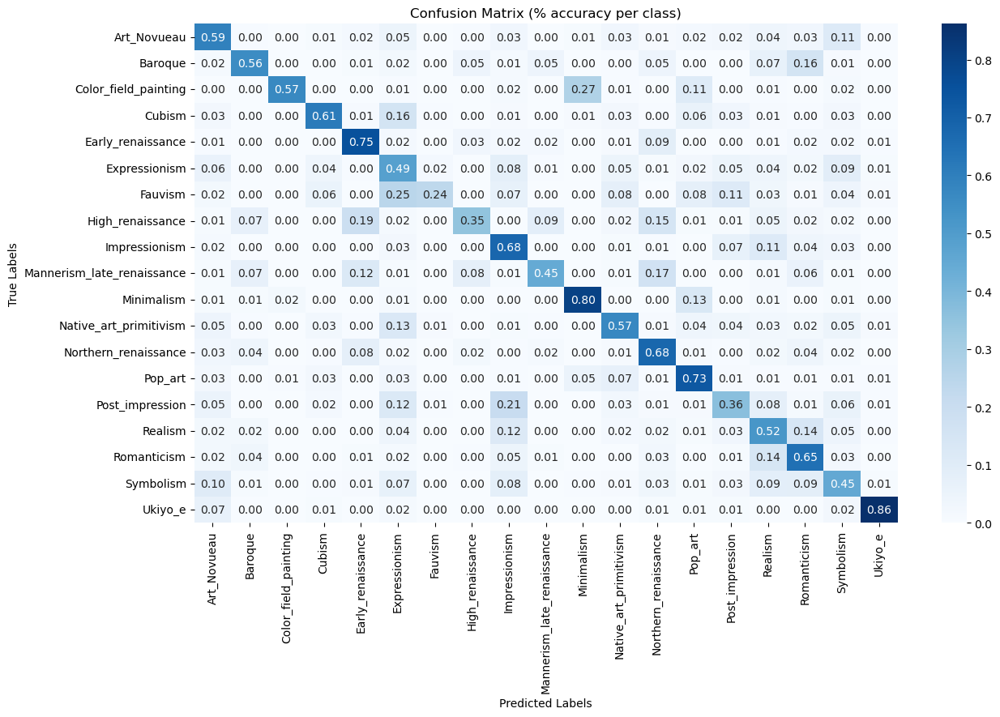

                            precision    recall  f1-score   support

               Art_Novueau       0.51      0.59      0.55       413
                   Baroque       0.71      0.56      0.62       418
      Color_field_painting       0.93      0.57      0.70       182
                    Cubism       0.71      0.61      0.66       261
         Early_renaissance       0.55      0.75      0.64       157
             Expressionism       0.48      0.49      0.48       659
                   Fauvism       0.48      0.24      0.32        89
          High_renaissance       0.47      0.35      0.40       126
             Impressionism       0.68      0.68      0.68      1314
Mannerism_late_renaissance       0.55      0.45      0.49       137
                Minimalism       0.62      0.80      0.70       147
    Native_art_primitivism       0.54      0.57      0.55       278
      Northern_renaissance       0.50      0.68      0.57       240
                   Pop_art       0.47      0.73

In [29]:
# Path to saved model
model_path = "C:\\Users\\PRANAV\\Downloads\\mobnet_1.h5"
model = load_model(model_path)


test_data_directory = "D:\\Wikiart_splitted\\test"

batch_size = 32
image_height = 224
image_width = 224

# ImageDataGenerator for preprocessing and loading test images
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_directory,
    target_size=(image_height, image_width), 
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=False)

# Make predictions
predictions = model.predict(test_generator, steps=np.ceil(test_generator.samples/test_generator.batch_size), verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

# True labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Get class labels from the generator

# Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Normalize the confusion matrix
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot confusion matrix
plt.figure(figsize=(14, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix (% accuracy per class)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Classification Report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

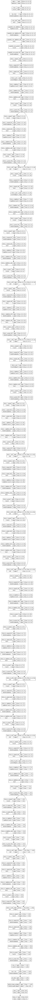

In [10]:
# Load the model
model_path = "C:\\Users\\PRANAV\\Downloads\\mobnet_1.h5"
model = load_model(model_path)

# Plot the model
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)


# Model 6: Resnet 150

Found 7596 images belonging to 19 classes.
238/238 [==============================] - 78s 320ms/step


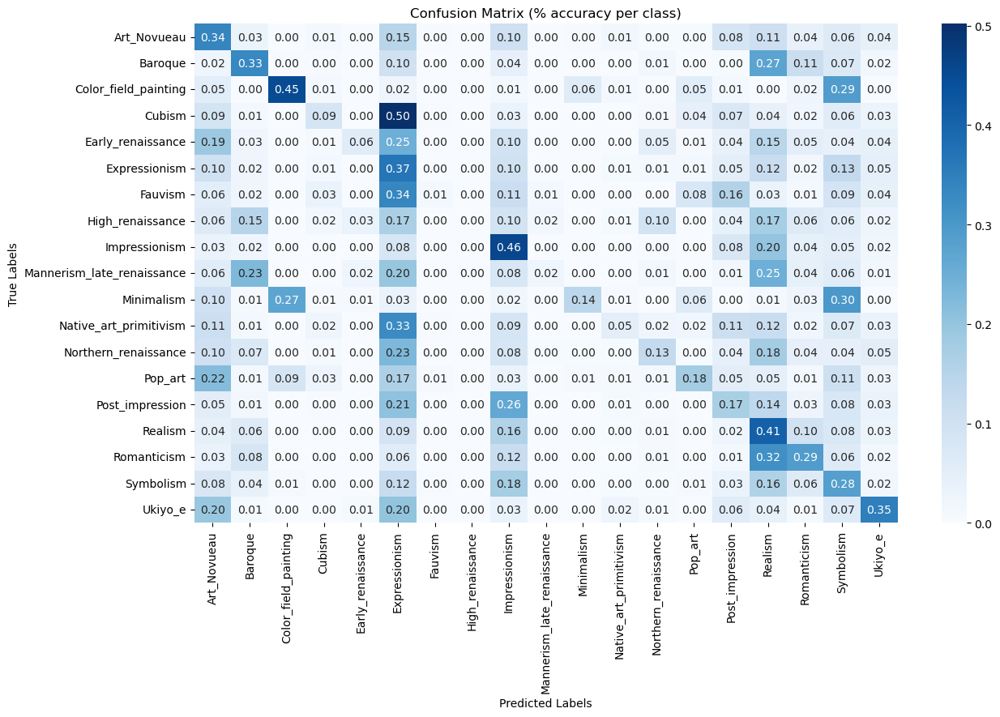

                            precision    recall  f1-score   support

               Art_Novueau       0.23      0.34      0.27       413
                   Baroque       0.32      0.33      0.33       418
      Color_field_painting       0.59      0.45      0.51       182
                    Cubism       0.39      0.09      0.14       261
         Early_renaissance       0.50      0.06      0.10       157
             Expressionism       0.20      0.37      0.26       659
                   Fauvism       0.12      0.01      0.02        89
          High_renaissance       0.00      0.00      0.00       126
             Impressionism       0.45      0.46      0.45      1314
Mannerism_late_renaissance       0.38      0.02      0.04       137
                Minimalism       0.57      0.14      0.23       147
    Native_art_primitivism       0.29      0.05      0.09       278
      Northern_renaissance       0.31      0.13      0.18       240
                   Pop_art       0.31      0.18

C:\Users\PRANAV\.conda\envs\tf_05\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\PRANAV\.conda\envs\tf_05\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\PRANAV\.conda\envs\tf_05\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [30]:
# Path to saved model
model_path = "C:\\Users\\PRANAV\\Downloads\\resnet150_1.h5"
model = load_model(model_path)

test_data_directory = "D:\\Wikiart_splitted\\test"

batch_size = 32
image_height = 224
image_width = 224

# ImageDataGenerator for preprocessing and loading test images
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_directory,
    target_size=(image_height, image_width), 
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=False)

# Make predictions
predictions = model.predict(test_generator, steps=np.ceil(test_generator.samples/test_generator.batch_size), verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

# True labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Get class labels from the generator

# Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Normalize the confusion matrix
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot confusion matrix
plt.figure(figsize=(14, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix (% accuracy per class)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Classification Report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

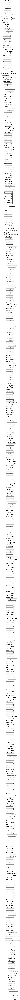

In [11]:
# Load the model
model_path = "C:\\Users\\PRANAV\\Downloads\\resnet150_1.h5"
model = load_model(model_path)

# Plot the model
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)


# Model 7: Inception

Found 7596 images belonging to 19 classes.
238/238 [==============================] - 73s 302ms/step


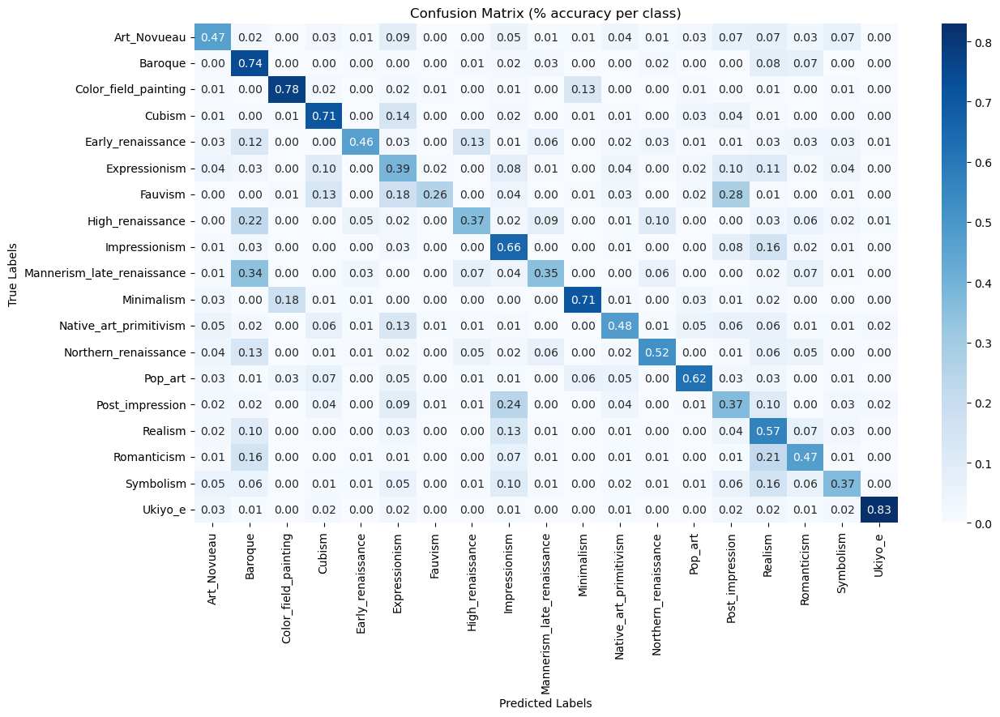

                            precision    recall  f1-score   support

               Art_Novueau       0.57      0.47      0.51       413
                   Baroque       0.41      0.74      0.53       418
      Color_field_painting       0.78      0.78      0.78       182
                    Cubism       0.52      0.71      0.60       261
         Early_renaissance       0.70      0.46      0.56       157
             Expressionism       0.45      0.39      0.42       659
                   Fauvism       0.52      0.26      0.35        89
          High_renaissance       0.41      0.37      0.39       126
             Impressionism       0.63      0.66      0.64      1314
Mannerism_late_renaissance       0.38      0.35      0.36       137
                Minimalism       0.71      0.71      0.71       147
    Native_art_primitivism       0.53      0.48      0.50       278
      Northern_renaissance       0.67      0.52      0.59       240
                   Pop_art       0.58      0.62

In [31]:
# Path to saved model
model_path = "C:\\Users\\PRANAV\\Downloads\\inception_1.h5"
model = load_model(model_path)

test_data_directory = "D:\\Wikiart_splitted\\test"

batch_size = 32
image_height = 224
image_width = 224

# ImageDataGenerator for preprocessing and loading test images
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_data_directory,
    target_size=(image_height, image_width), 
    batch_size=batch_size,
    class_mode='categorical',  
    shuffle=False)

# Make predictions
predictions = model.predict(test_generator, steps=np.ceil(test_generator.samples/test_generator.batch_size), verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

# True labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Get class labels from the generator

# Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Normalize the confusion matrix
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot confusion matrix
plt.figure(figsize=(14, 8))
sns.heatmap(conf_matrix_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix (% accuracy per class)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Classification Report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

In [12]:
# Load the model
model_path = "C:\\Users\\PRANAV\\Downloads\\inception_1.h5"
model = load_model(model_path)

# Plot the model
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)


In [20]:
from tensorflow.keras.models import load_model

model1 = load_model("C:\\Users\\PRANAV\\Downloads\\bagging_cnn1.h5")
model2 = load_model("C:\\Users\\PRANAV\\Downloads\\xcept1.h5") # needs 299 x 299 image size
model3 = load_model("C:\\Users\\PRANAV\\Downloads\\Densenet121_01.h5") # needs 299 x 299 image size
model4 = load_model("C:\\Users\\PRANAV\\Downloads\\vgg19_1.h5")
model5 = load_model("C:\\Users\\PRANAV\\Downloads\\mobnet_1.h5")
model6 = load_model("C:\\Users\\PRANAV\\Downloads\\resnet150_1.h5")
model7 = load_model("C:\\Users\\PRANAV\\Downloads\\inception_1.h5")


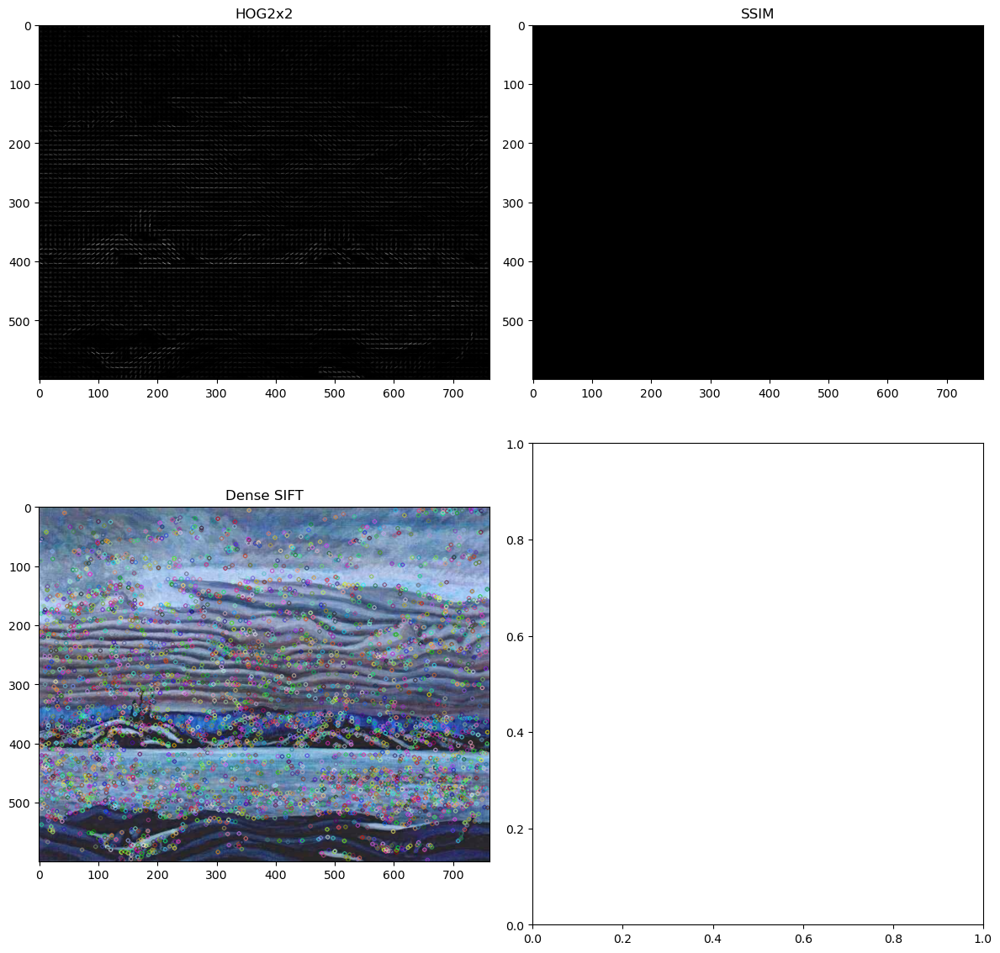

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.feature import hog
from skimage.metrics import structural_similarity as ssim

# Load Image
image = cv2.imread("D:\\feature visualisation\\a.y.-jackson_algoma-in-november-1935.jpg")
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# HOG Feature Extraction
hog_features, hog_image = hog(image_gray, visualize=True, block_norm='L2-Hys')

# SSIM - Compare the image to a slightly altered version (for example)
ssim_map = ssim(image_gray, image_gray, full=True)[1]

# SIFT Feature Extraction
sift = cv2.SIFT_create()
keypoints, descriptors = sift.detectAndCompute(image_gray, None)
image_sift = cv2.drawKeypoints(image, keypoints, None)

# Visualization
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

ax[0, 0].imshow(hog_image, cmap='gray')
ax[0, 0].set_title('HOG2x2')

ax[0, 1].imshow(ssim_map, cmap='gray')
ax[0, 1].set_title('SSIM')

ax[1, 0].imshow(image_sift)
ax[1, 0].set_title('Dense SIFT')

plt.tight_layout()
plt.show()


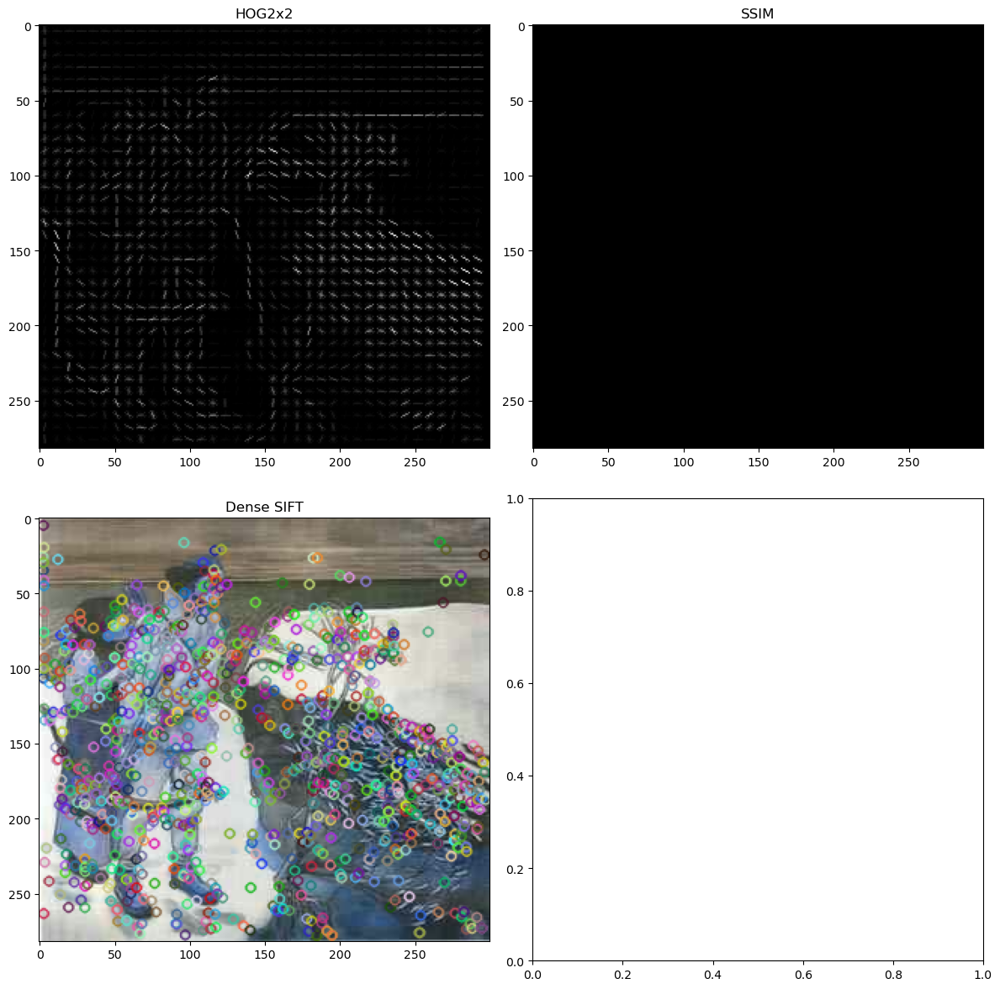

In [2]:
# Load Image
image = cv2.imread("D:\\feature visualisation\\akseli-gallen-kallela_joukahainen-s-revenge.jpg")
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# HOG Feature Extraction
hog_features, hog_image = hog(image_gray, visualize=True, block_norm='L2-Hys')

# SSIM - Compare the image to a slightly altered version (for example)
ssim_map = ssim(image_gray, image_gray, full=True)[1]

# SIFT Feature Extraction
sift = cv2.SIFT_create()
keypoints, descriptors = sift.detectAndCompute(image_gray, None)
image_sift = cv2.drawKeypoints(image, keypoints, None)

# Visualization
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

ax[0, 0].imshow(hog_image, cmap='gray')
ax[0, 0].set_title('HOG2x2')

ax[0, 1].imshow(ssim_map, cmap='gray')
ax[0, 1].set_title('SSIM')

ax[1, 0].imshow(image_sift)
ax[1, 0].set_title('Dense SIFT')

plt.tight_layout()
plt.show()


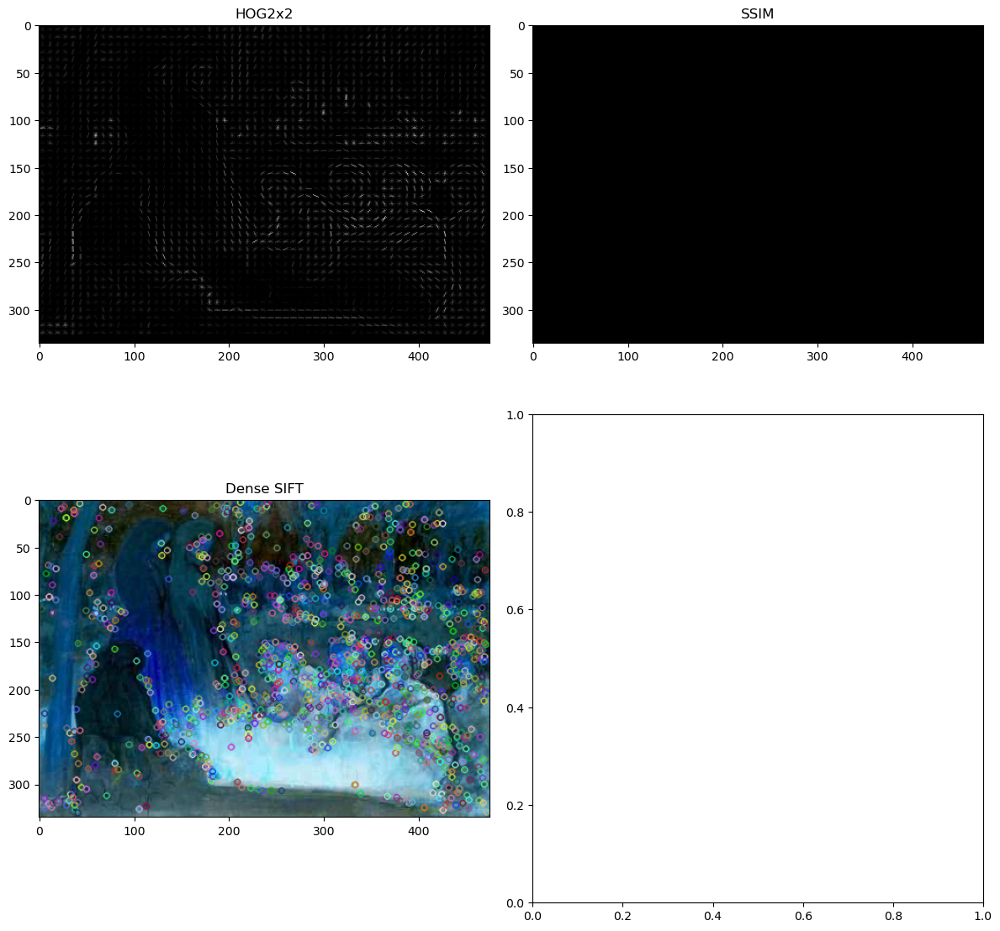

In [3]:
# Load Image
image = cv2.imread("D:\\feature visualisation\\aladar-korosfoi-kriesch_all-souls-day-1910.jpg")
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# HOG Feature Extraction
hog_features, hog_image = hog(image_gray, visualize=True, block_norm='L2-Hys')

# SSIM - Compare the image to a slightly altered version (for example)
ssim_map = ssim(image_gray, image_gray, full=True)[1]

# SIFT Feature Extraction
sift = cv2.SIFT_create()
keypoints, descriptors = sift.detectAndCompute(image_gray, None)
image_sift = cv2.drawKeypoints(image, keypoints, None)

# Visualization
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

ax[0, 0].imshow(hog_image, cmap='gray')
ax[0, 0].set_title('HOG2x2')

ax[0, 1].imshow(ssim_map, cmap='gray')
ax[0, 1].set_title('SSIM')

ax[1, 0].imshow(image_sift)
ax[1, 0].set_title('Dense SIFT')

plt.tight_layout()
plt.show()
